In [1]:

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from matplotlib.patches import Circle
import warnings
warnings.filterwarnings('ignore')

# Configure matplotlib for publication-ready plots
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12

class RemoteSensingAnalyzer:
    
    
    def __init__(self, ref_image_path, sec_image_path=None):
        """Initialize with reference and secondary aerial images"""
        self.ref_bgr = cv2.imread(str(ref_image_path))
        if self.ref_bgr is None:
            raise FileNotFoundError(f"Reference image not found: {ref_image_path}")
        self.ref_gray = cv2.cvtColor(self.ref_bgr, cv2.COLOR_BGR2GRAY)
        
        if sec_image_path is not None:
            self.sec_bgr = cv2.imread(str(sec_image_path))
            if self.sec_bgr is None:
                raise FileNotFoundError(f"Secondary image not found: {sec_image_path}")
            self.sec_gray = cv2.cvtColor(self.sec_bgr, cv2.COLOR_BGR2GRAY)
        else:
            self.sec_bgr = self.sec_gray = None
            
        self.analysis_results = {}
        
    def apply_frequency_filter(self, img, filter_type='gaussian_lowpass', cutoff=50):
        """
        Apply frequency domain filtering for remote sensing image enhancement.
        
        Parameters:
        -----------
        img : numpy.ndarray
            Input grayscale image
        filter_type : str
            Type of filter ('gaussian_lowpass', 'ideal_lowpass', 'gaussian_highpass')
        cutoff : int
            Cutoff frequency for the filter
            
        Returns:
        --------
        filtered_img : numpy.ndarray
            Filtered image in spatial domain
        filter_mask : numpy.ndarray
            Frequency domain filter mask
        magnitude_spectrum : numpy.ndarray
            Magnitude spectrum of original image
        """
        rows, cols = img.shape
        crow, ccol = rows//2, cols//2
        
        # Transform to frequency domain
        f_transform = np.fft.fft2(img)
        f_shift = np.fft.fftshift(f_transform)
        magnitude_spectrum = np.log(np.abs(f_shift) + 1)
        
        # Create coordinate matrices
        x = np.arange(0, cols)
        y = np.arange(0, rows)
        X, Y = np.meshgrid(x, y)
        D = np.sqrt((X - ccol)**2 + (Y - crow)**2)
        
        # Generate filter mask
        if filter_type == 'gaussian_lowpass':
            filter_mask = np.exp(-(D**2)/(2*(cutoff**2)))
        elif filter_type == 'ideal_lowpass':
            filter_mask = np.zeros((rows, cols), dtype=np.float32)
            filter_mask[D <= cutoff] = 1
        elif filter_type == 'gaussian_highpass':
            filter_mask = 1 - np.exp(-(D**2)/(2*(cutoff**2)))
        else:
            raise ValueError(f"Unknown filter type: {filter_type}")
            
        # Apply filter and inverse transform
        f_filtered = f_shift * filter_mask
        f_ishift = np.fft.ifftshift(f_filtered)
        filtered_img = np.fft.ifft2(f_ishift)
        filtered_img = np.abs(filtered_img).astype(np.uint8)
        
        return filtered_img, filter_mask, magnitude_spectrum
    
    def extract_sift_features(self, img):
        """
        Extract SIFT features from aerial imagery for remote sensing analysis.
        
        Parameters:
        -----------
        img : numpy.ndarray
            Input grayscale image
            
        Returns:
        --------
        keypoints : list
            Detected SIFT keypoints
        descriptors : numpy.ndarray
            SIFT feature descriptors
        """
        try:
            sift = cv2.SIFT_create(nfeatures=2000)
            keypoints, descriptors = sift.detectAndCompute(img, None)
            return keypoints, descriptors
        except Exception as e:
            print(f"SIFT feature extraction failed: {e}")
            return [], None
    
    def match_features_with_analysis(self, desc1, desc2, ratio_threshold=0.7):
        """
        Perform robust feature matching with comprehensive quality metrics.
        
        Parameters:
        -----------
        desc1, desc2 : numpy.ndarray
            Feature descriptors from reference and secondary images
        ratio_threshold : float
            Lowe's ratio test threshold
            
        Returns:
        --------
        good_matches : list
            High-quality matches after ratio test
        match_statistics : dict
            Comprehensive matching performance metrics
        """
        if desc1 is None or desc2 is None or len(desc1) == 0 or len(desc2) == 0:
            return [], {'error': 'Insufficient descriptors for matching'}
        
        # BFMatcher with L2 norm for SIFT
        bf = cv2.BFMatcher(cv2.NORM_L2)
        raw_matches = bf.knnMatch(desc1, desc2, k=2)
        
        # Apply Lowe's ratio test
        good_matches = []
        distances = []
        ratios = []
        
        for match_pair in raw_matches:
            if len(match_pair) == 2:
                m, n = match_pair
                ratio = m.distance / n.distance
                ratios.append(ratio)
                if ratio < ratio_threshold:
                    good_matches.append(m)
                    distances.append(m.distance)
        
        # Compute comprehensive statistics
        match_statistics = {
            'total_raw_matches': len(raw_matches),
            'good_matches_count': len(good_matches),
            'matching_ratio': len(good_matches) / len(raw_matches) if raw_matches else 0,
            'mean_distance': np.mean(distances) if distances else 0,
            'std_distance': np.std(distances) if distances else 0,
            'median_distance': np.median(distances) if distances else 0,
            'mean_lowe_ratio': np.mean(ratios) if ratios else 0
        }
        
        return good_matches, match_statistics
    
    def estimate_geometric_transformation(self, kp1, kp2, matches):
        """
        Estimate geometric transformation using RANSAC-based homography.
        
        Parameters:
        -----------
        kp1, kp2 : list
            Keypoints from reference and secondary images
        matches : list
            Good matches from feature matching
            
        Returns:
        --------
        homography : numpy.ndarray or None
            Estimated homography matrix
        inliers : list
            Inlier matches after RANSAC
        geometric_stats : dict
            Geometric transformation quality metrics
        """
        if len(matches) < 10:
            return None, [], {'error': 'Insufficient matches for homography estimation'}
        
        # Extract matched point coordinates
        pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
        
        # RANSAC homography estimation
        homography, mask = cv2.findHomography(
            pts1, pts2,
            method=cv2.RANSAC,
            ransacReprojThreshold=5.0,
            maxIters=5000,
            confidence=0.995
        )
        
        if mask is not None:
            inliers = [matches[i] for i, m in enumerate(mask.ravel()) if m]
            inlier_ratio = len(inliers) / len(matches)
            
            # Calculate reprojection errors
            if homography is not None:
                pts1_reproj = cv2.perspectiveTransform(pts1, homography)
                errors = np.sqrt(np.sum((pts2 - pts1_reproj)**2, axis=2)).flatten()
                mean_error = np.mean(errors[mask.ravel() == 1])
            else:
                mean_error = float('inf')
        else:
            inliers = []
            inlier_ratio = 0
            mean_error = float('inf')
        
        geometric_stats = {
            'homography_found': homography is not None,
            'inliers_count': len(inliers),
            'inlier_ratio': inlier_ratio,
            'mean_reprojection_error': mean_error
        }
        
        return homography, inliers, geometric_stats
    
    def visualize_filter_effects(self, img, filter_types, cutoffs, figsize=(12, 4)):
        """
        Visualize the effects of different frequency domain filters on aerial imagery.
        Each row shows the filtered image (left) and its filter mask (right).
        """
        n_filters = len(filter_types)
        if n_filters == 0:
            return None  # Or handle empty case as needed
        
        fig, axes = plt.subplots(n_filters, 2, figsize=(figsize[0], figsize[1] * n_filters))

        # Ensure axes is always 2D
        if n_filters == 1:
            axes = axes.reshape(1, -1)

        # Rows: Filtered image + filter mask
        for i, (filter_type, cutoff) in enumerate(zip(filter_types, cutoffs)):
            filtered_img, filter_mask, magnitude_spectrum = self.apply_frequency_filter(
                img, filter_type, cutoff
            )

            # Left: filtered image
            axes[i, 0].imshow(filtered_img, cmap='gray')
            title = filter_type.replace('_', ' ').title()
            axes[i, 0].set_title(f'{title}\n(Cutoff: {cutoff})', fontweight='bold')
            axes[i, 0].axis('off')

            # Right: filter mask
            axes[i, 1].imshow(filter_mask, cmap='gray')
            axes[i, 1].set_title('Filter Mask\n(Frequency Domain)', fontweight='bold')
            axes[i, 1].axis('off')

        plt.tight_layout()
        plt.show()
        return fig

    
    def visualize_feature_matches(self, img1, img2, kp1, kp2, matches, title, 
                                 max_matches=50, figsize=(16, 8)):
        """
        Create publication-quality feature matching visualization.
        """
        fig, ax = plt.subplots(1, 1, figsize=figsize)
        
        # Convert to RGB if needed
        if len(img1.shape) == 3:
            img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
            img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
        else:
            img1_rgb = cv2.cvtColor(img1, cv2.COLOR_GRAY2RGB)
            img2_rgb = cv2.cvtColor(img2, cv2.COLOR_GRAY2RGB)
        
        # Create side-by-side layout
        h1, w1 = img1.shape[:2]
        h2, w2 = img2.shape[:2]
        combined_img = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
        combined_img[:h1, :w1] = img1_rgb
        combined_img[:h2, w1:w1+w2] = img2_rgb
        
        ax.imshow(combined_img)
        
        # Draw matches with quality-based coloring
        if len(matches) > 0:
            # Sort by distance and select best matches
            sorted_matches = sorted(matches, key=lambda x: x.distance)[:max_matches]
            distances = [m.distance for m in sorted_matches]
            
            if distances:
                # Normalize distances for color mapping
                distances_array = np.array(distances)
                min_dist = np.min(distances_array)
                max_dist = np.max(distances_array)
                if max_dist > min_dist:
                    norm_distances = (distances_array - min_dist) / (max_dist - min_dist)
                else:
                    norm_distances = np.zeros(len(distances_array))
                
                for i, (match, norm_dist) in enumerate(zip(sorted_matches, norm_distances)):
                    pt1 = kp1[match.queryIdx].pt
                    pt2 = kp2[match.trainIdx].pt
                    pt2_shifted = (pt2[0] + w1, pt2[1])
                    
                    # Color coding: green for good matches, red for poor matches
                    color = plt.cm.RdYlGn_r(norm_dist)
                    alpha = 0.8 if norm_dist < 0.5 else 0.6
                    
                    ax.plot([pt1[0], pt2_shifted[0]], [pt1[1], pt2_shifted[1]], 
                           color=color, linewidth=1.5, alpha=alpha)
                    
                    # Mark keypoints
                    ax.scatter(pt1[0], pt1[1], c='blue', s=20, marker='o', alpha=0.8)
                    ax.scatter(pt2_shifted[0], pt2_shifted[1], c='red', s=20, marker='o', alpha=0.8)
        
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.axis('off')
        
        # Add image labels
        ax.text(w1//2, -20, 'Reference Image', ha='center', va='top', fontsize=12, fontweight='bold')
        ax.text(w1 + w2//2, -20, 'Query Image (3x Zoom)', ha='center', va='top', fontsize=12, fontweight='bold')
        
        plt.tight_layout()
        plt.show()
        
        return fig
    
    def create_results_table(self, results_dict):
        """
        Create comprehensive results table with clear remote sensing metrics.
        """
        df_data = []
        for experiment, stats in results_dict.items():
            if 'error' not in stats:
                # Calculate meaningful derived metrics
                features_ref = stats.get('features_ref', 0)
                features_query = stats.get('features_query', 0)
                raw_matches = stats.get('total_raw_matches', 0)
                good_matches = stats.get('good_matches_count', 0)
                inliers = stats.get('inliers_count', 0)
                
                # Feature density (features per 1000 pixels, assuming ~500x500 images)
                ref_density = (features_ref / 250000) * 1000 if features_ref > 0 else 0
                query_density = (features_query / 250000) * 1000 if features_query > 0 else 0
                
                # Matching success rate (good matches / minimum features)
                min_features = min(features_ref, features_query) if features_ref > 0 and features_query > 0 else 1
                matching_success = (good_matches / min_features) * 100
                
                # Geometric reliability (inliers / good matches)
                geo_reliability = (inliers / good_matches * 100) if good_matches > 0 else 0
                
                # Overall robustness score (combines matching and geometric quality)
                robustness_score = (matching_success * 0.3 + geo_reliability * 0.7) if geo_reliability > 0 else 0
                
                df_data.append({
                    'Experiment': experiment,
                    'Features Detected': f"{features_ref} / {features_query}",
                    'Feature Density': f"{ref_density:.1f} / {query_density:.1f}",
                    'Correspondences': f"{good_matches} / {raw_matches}",
                    'Matching Success (%)': f"{matching_success:.1f}",
                    'Geometric Inliers': f"{inliers}",
                    'Geo. Reliability (%)': f"{geo_reliability:.1f}",
                    'Robustness Score': f"{robustness_score:.1f}",
                    'Reproj. Error (px)': f"{stats.get('mean_reprojection_error', float('inf')):.2f}"
                })
        
        df = pd.DataFrame(df_data)
        return df
    
    def apply_rotation_transform(self, img, angle_degrees):
        """
        Apply rotation transformation to simulate camera orientation changes.
        """
        h, w = img.shape[:2]
        center = (w // 2, h // 2)
        
        # Get rotation matrix
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_degrees, 1.0)
        
        # Apply rotation
        rotated_img = cv2.warpAffine(img, rotation_matrix, (w, h), 
                                    flags=cv2.INTER_LINEAR, 
                                    borderMode=cv2.BORDER_REFLECT)
        
        return rotated_img

# Initialize the analyzer (you'll need to update these paths)
print("Remote Sensing Feature Detection Analysis")
print("="*50)
print("This notebook analyzes the impact of frequency domain filtering")
print("on feature detection and matching in aerial imagery.")
print()

# Note: Update these paths to your actual image files
ref_image_path = "city_aerial_image.jpg"  # Update this path
sec_image_path = "city_aerial_image_zoomed.jpg"  # Update this path

# Initialize analyzer
try:
    analyzer = RemoteSensingAnalyzer(ref_image_path, sec_image_path)
    print("Images loaded successfully")
    print(f"Reference image shape: {analyzer.ref_gray.shape}")
    print(f"Secondary image shape: {analyzer.sec_gray.shape}")
except Exception as e:
    print(f"Error loading images: {e}")
    print("Please update the image paths in the code above.")


Remote Sensing Feature Detection Analysis
This notebook analyzes the impact of frequency domain filtering
on feature detection and matching in aerial imagery.

Images loaded successfully
Reference image shape: (4536, 8064)
Secondary image shape: (4536, 8064)


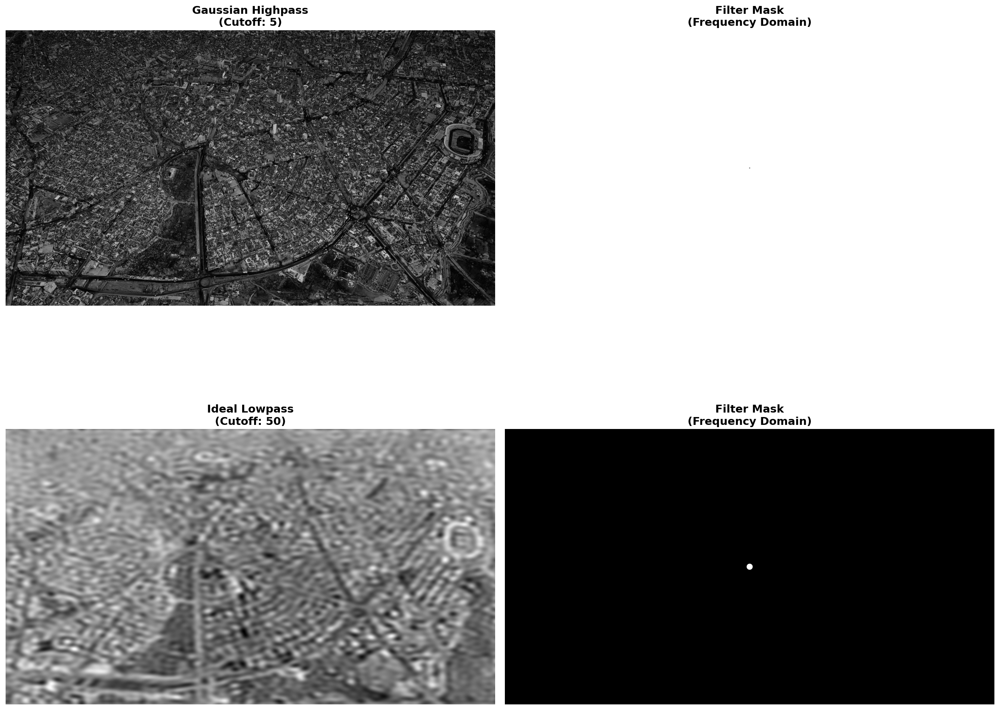

Frequency domain analysis completed


In [2]:
# =============================================================================
# EXPERIMENT 1: FREQUENCY DOMAIN FILTERING EFFECTS
# =============================================================================

# Define filter parameters for comprehensive analysis
filter_types = ['gaussian_highpass', 'ideal_lowpass']
cutoff_frequencies = [5, 50]

# Apply and visualize filtering effects
try:
    fig1 = analyzer.visualize_filter_effects(
        analyzer.ref_gray, 
        filter_types, 
        cutoff_frequencies,
        figsize=(18, 8)
    )
    print("Frequency domain analysis completed")
except Exception as e:
    print(f"Filtering analysis failed: {e}")

Reference image features: 2000
Query image features: 2000


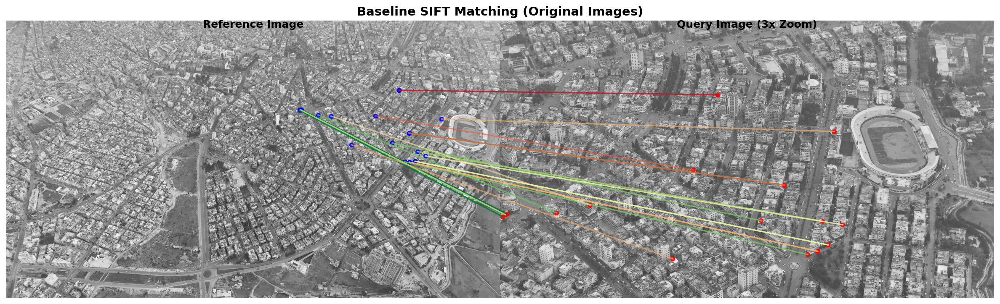

Baseline SIFT analysis completed


In [3]:
# =============================================================================
# EXPERIMENT 2: BASELINE SIFT MATCHING
# =============================================================================

try:
    # Extract SIFT features from original images
    kp1_baseline, desc1_baseline = analyzer.extract_sift_features(analyzer.ref_gray)
    kp2_baseline, desc2_baseline = analyzer.extract_sift_features(analyzer.sec_gray)
    
    print(f"Reference image features: {len(kp1_baseline)}")
    print(f"Query image features: {len(kp2_baseline)}")
    
    # Perform feature matching
    matches_baseline, match_stats_baseline = analyzer.match_features_with_analysis(
        desc1_baseline, desc2_baseline
    )
    
    # Estimate geometric transformation
    homography_baseline, inliers_baseline, geo_stats_baseline = analyzer.estimate_geometric_transformation(
        kp1_baseline, kp2_baseline, matches_baseline
    )
    
    # Combine statistics
    baseline_results = {**match_stats_baseline, **geo_stats_baseline}
    baseline_results['features_ref'] = len(kp1_baseline)
    baseline_results['features_query'] = len(kp2_baseline)
    
    # Visualize results
    analyzer.visualize_feature_matches(
        analyzer.ref_gray, analyzer.sec_gray, 
        kp1_baseline, kp2_baseline, inliers_baseline,
        title="Baseline SIFT Matching (Original Images)",
        max_matches=100
    )
    
    analyzer.analysis_results['Baseline SIFT'] = baseline_results
    print("Baseline SIFT analysis completed")
    
except Exception as e:
    print(f"Baseline SIFT analysis failed: {e}")




Reference image features (high-pass): 2000
Query image features (high-pass): 2000


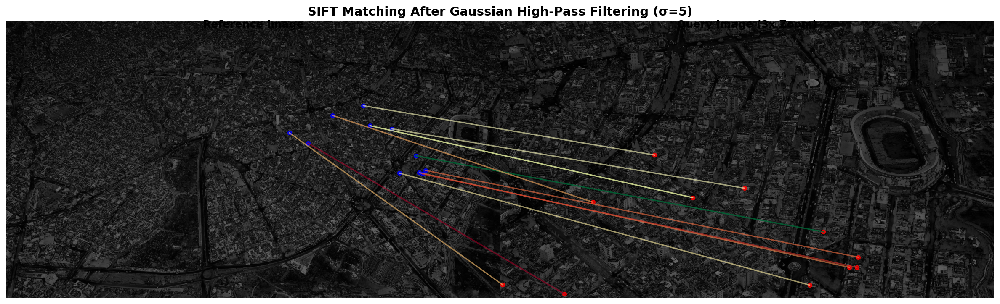

High-pass filtering analysis completed


In [4]:
# =============================================================================
# EXPERIMENT 3: SIFT MATCHING AFTER HIGH-PASS FILTERING
# =============================================================================


try:
    cutoff = 5
    # Apply high-pass filtering
    ref_highpass, _, _ = analyzer.apply_frequency_filter(
        analyzer.ref_gray, 'gaussian_highpass', cutoff=cutoff
    )
    sec_highpass, _, _ = analyzer.apply_frequency_filter(
        analyzer.sec_gray, 'gaussian_highpass', cutoff=cutoff
    )
    
    # Extract features from filtered images
    kp1_hp, desc1_hp = analyzer.extract_sift_features(ref_highpass)
    kp2_hp, desc2_hp = analyzer.extract_sift_features(sec_highpass)
    
    print(f"Reference image features (high-pass): {len(kp1_hp)}")
    print(f"Query image features (high-pass): {len(kp2_hp)}")
    
    # Feature matching
    matches_hp, match_stats_hp = analyzer.match_features_with_analysis(desc1_hp, desc2_hp)
    
    # Geometric estimation
    homography_hp, inliers_hp, geo_stats_hp = analyzer.estimate_geometric_transformation(
        kp1_hp, kp2_hp, matches_hp
    )
    
    # Store results
    hp_results = {**match_stats_hp, **geo_stats_hp}
    hp_results['features_ref'] = len(kp1_hp)
    hp_results['features_query'] = len(kp2_hp)
    
    # Visualize
    analyzer.visualize_feature_matches(
        ref_highpass, sec_highpass, 
        kp1_hp, kp2_hp, inliers_hp,
        title=f"SIFT Matching After Gaussian High-Pass Filtering (σ={cutoff})",
        max_matches=100
    )
    
    analyzer.analysis_results['High-Pass Filtered'] = hp_results
    print("High-pass filtering analysis completed")
    
except Exception as e:
    print(f"High-pass filtering analysis failed: {e}")

Reference image features (low-pass): 1553
Query image features (low-pass): 1469


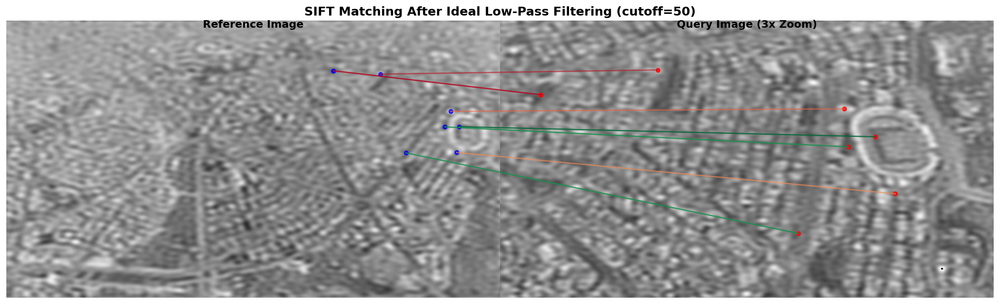

Low-pass filtering analysis completed


In [5]:

# =============================================================================
# EXPERIMENT 4: SIFT MATCHING AFTER LOW-PASS FILTERING
# =============================================================================


try:
    # Apply ideal low-pass filtering
    ref_lowpass, _, _ = analyzer.apply_frequency_filter(
        analyzer.ref_gray, 'ideal_lowpass', cutoff=50
    )
    sec_lowpass, _, _ = analyzer.apply_frequency_filter(
        analyzer.sec_gray, 'ideal_lowpass', cutoff=50
    )
    
    # Extract features
    kp1_lp, desc1_lp = analyzer.extract_sift_features(ref_lowpass)
    kp2_lp, desc2_lp = analyzer.extract_sift_features(sec_lowpass)
    
    print(f"Reference image features (low-pass): {len(kp1_lp)}")
    print(f"Query image features (low-pass): {len(kp2_lp)}")
    
    # Feature matching
    matches_lp, match_stats_lp = analyzer.match_features_with_analysis(desc1_lp, desc2_lp)
    
    # Geometric estimation
    homography_lp, inliers_lp, geo_stats_lp = analyzer.estimate_geometric_transformation(
        kp1_lp, kp2_lp, matches_lp
    )
    
    # Store results
    lp_results = {**match_stats_lp, **geo_stats_lp}
    lp_results['features_ref'] = len(kp1_lp)
    lp_results['features_query'] = len(kp2_lp)
    
    # Visualize
    analyzer.visualize_feature_matches(
        ref_lowpass, sec_lowpass, 
        kp1_lp, kp2_lp, inliers_lp,
        title="SIFT Matching After Ideal Low-Pass Filtering (cutoff=50)",
        max_matches=100
    )
    
    analyzer.analysis_results['Low-Pass Filtered'] = lp_results
    print("Low-pass filtering analysis completed")
    
except Exception as e:
    print(f"Low-pass filtering analysis failed: {e}")



Applied rotation: 15 degrees
Reference image features: 2000
Rotated query features: 2000


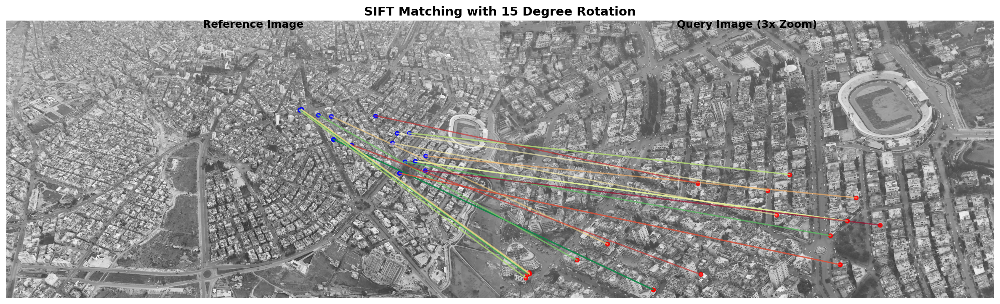

Rotation transformation analysis completed


In [6]:
# =============================================================================
# EXPERIMENT 5: SIFT MATCHING WITH GEOMETRIC TRANSFORMATION
# =============================================================================

try:
    # Apply rotation to secondary image
    rotation_angle = 15  # degrees
    sec_rotated = analyzer.apply_rotation_transform(analyzer.sec_gray, rotation_angle)
    
    print(f"Applied rotation: {rotation_angle} degrees")
    
    # Extract features
    kp1_rot, desc1_rot = analyzer.extract_sift_features(analyzer.ref_gray)
    kp2_rot, desc2_rot = analyzer.extract_sift_features(sec_rotated)
    
    print(f"Reference image features: {len(kp1_rot)}")
    print(f"Rotated query features: {len(kp2_rot)}")
    
    # Feature matching
    matches_rot, match_stats_rot = analyzer.match_features_with_analysis(desc1_rot, desc2_rot)
    
    # Geometric estimation
    homography_rot, inliers_rot, geo_stats_rot = analyzer.estimate_geometric_transformation(
        kp1_rot, kp2_rot, matches_rot
    )
    
    # Store results
    rot_results = {**match_stats_rot, **geo_stats_rot}
    rot_results['features_ref'] = len(kp1_rot)
    rot_results['features_query'] = len(kp2_rot)
    
    # Visualize
    analyzer.visualize_feature_matches(
        analyzer.ref_gray, sec_rotated, 
        kp1_rot, kp2_rot, inliers_rot,
        title=f"SIFT Matching with {rotation_angle} Degree Rotation",
        max_matches=100
    )
    
    analyzer.analysis_results[f'Rotated ({rotation_angle}°)'] = rot_results
    print("Rotation transformation analysis completed")
    
except Exception as e:
    print(f"Rotation analysis failed: {e}")


QUANTITATIVE PERFORMANCE COMPARISON:
        Experiment Features Detected Feature Density Correspondences Matching Success (%) Geometric Inliers Geo. Reliability (%) Robustness Score Reproj. Error (px)
     Baseline SIFT       2000 / 2000       8.0 / 8.0       47 / 2000                  2.4                22                 46.8             33.5               1.97
High-Pass Filtered       2000 / 2000       8.0 / 8.0       16 / 2000                  0.8                11                 68.8             48.4               1.77
 Low-Pass Filtered       1553 / 1469       6.2 / 5.9       31 / 1553                  2.1                 8                 25.8             18.7               2.17
     Rotated (15°)       2000 / 2000       8.0 / 8.0       42 / 2000                  2.1                20                 47.6             34.0               2.39


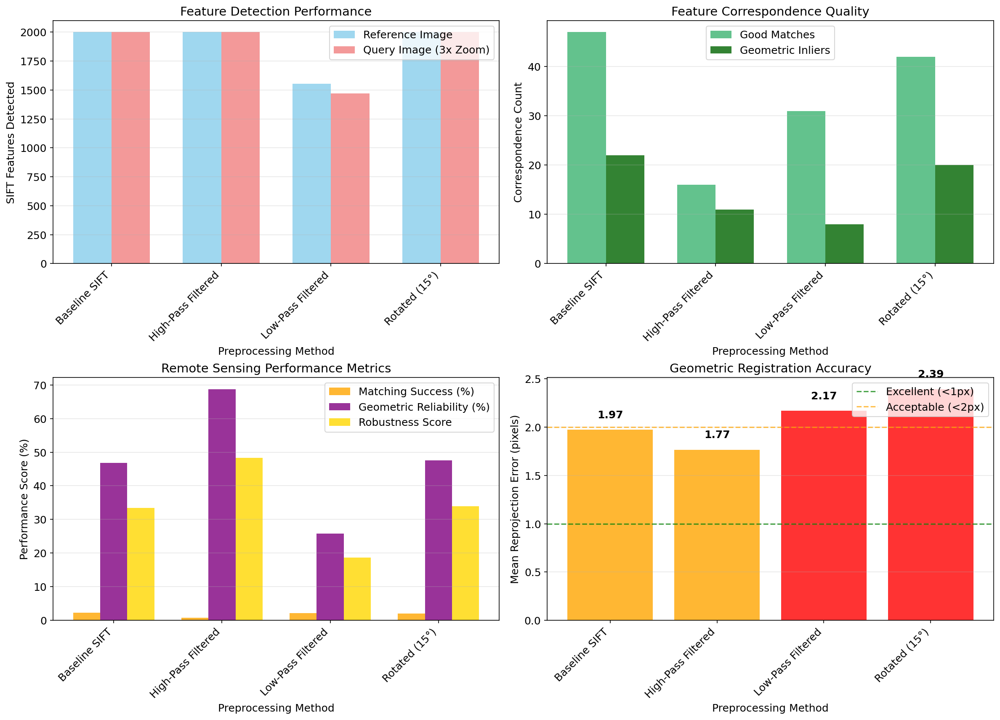


Comprehensive analysis completed successfully


In [7]:

# =============================================================================
# COMPREHENSIVE RESULTS ANALYSIS
# =============================================================================

try:
    # Create results summary table
    results_df = analyzer.create_results_table(analyzer.analysis_results)
    
    
    print("\nQUANTITATIVE PERFORMANCE COMPARISON:")
    print("="*50)
    print(results_df.to_string(index=False))
    
    # Create visualization of results
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    experiments = list(analyzer.analysis_results.keys())
    
    # Extract metrics for plotting
    ref_features = [analyzer.analysis_results[exp].get('features_ref', 0) for exp in experiments]
    query_features = [analyzer.analysis_results[exp].get('features_query', 0) for exp in experiments]
    good_matches = [analyzer.analysis_results[exp].get('good_matches_count', 0) for exp in experiments]
    inliers = [analyzer.analysis_results[exp].get('inliers_count', 0) for exp in experiments]
    
    # Calculate derived metrics
    matching_success = []
    geo_reliability = []
    robustness_scores = []
    
    for exp in experiments:
        stats = analyzer.analysis_results[exp]
        features_ref = stats.get('features_ref', 0)
        features_query = stats.get('features_query', 0)
        good_matches_count = stats.get('good_matches_count', 0)
        inliers_count = stats.get('inliers_count', 0)
        
        # Matching success rate
        min_features = min(features_ref, features_query) if features_ref > 0 and features_query > 0 else 1
        success_rate = (good_matches_count / min_features) * 100
        matching_success.append(success_rate)
        
        # Geometric reliability
        reliability = (inliers_count / good_matches_count * 100) if good_matches_count > 0 else 0
        geo_reliability.append(reliability)
        
        # Robustness score
        robustness = (success_rate * 0.3 + reliability * 0.7) if reliability > 0 else 0
        robustness_scores.append(robustness)
    
    x = np.arange(len(experiments))
    width = 0.35
    
    # 1. Feature Detection Comparison
    axes[0,0].bar(x - width/2, ref_features, width, label='Reference Image', alpha=0.8, color='skyblue')
    axes[0,0].bar(x + width/2, query_features, width, label='Query Image (3x Zoom)', alpha=0.8, color='lightcoral')
    axes[0,0].set_xlabel('Preprocessing Method')
    axes[0,0].set_ylabel('SIFT Features Detected')
    axes[0,0].set_title('Feature Detection Performance')
    axes[0,0].set_xticks(x)
    axes[0,0].set_xticklabels(experiments, rotation=45, ha='right')
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3, axis='y')
    
    # 2. Correspondence Quality
    axes[0,1].bar(x - width/2, good_matches, width, label='Good Matches', alpha=0.8, color='mediumseagreen')
    axes[0,1].bar(x + width/2, inliers, width, label='Geometric Inliers', alpha=0.8, color='darkgreen')
    axes[0,1].set_xlabel('Preprocessing Method')
    axes[0,1].set_ylabel('Correspondence Count')
    axes[0,1].set_title('Feature Correspondence Quality')
    axes[0,1].set_xticks(x)
    axes[0,1].set_xticklabels(experiments, rotation=45, ha='right')
    axes[0,1].legend()
    axes[0,1].grid(True, alpha=0.3, axis='y')
    
    # 3. Performance Metrics Comparison
    x_metrics = np.arange(len(experiments))
    width_metrics = 0.25
    
    axes[1,0].bar(x_metrics - width_metrics, matching_success, width_metrics, 
                  label='Matching Success (%)', alpha=0.8, color='orange')
    axes[1,0].bar(x_metrics, geo_reliability, width_metrics, 
                  label='Geometric Reliability (%)', alpha=0.8, color='purple')
    axes[1,0].bar(x_metrics + width_metrics, robustness_scores, width_metrics, 
                  label='Robustness Score', alpha=0.8, color='gold')
    
    axes[1,0].set_xlabel('Preprocessing Method')
    axes[1,0].set_ylabel('Performance Score (%)')
    axes[1,0].set_title('Remote Sensing Performance Metrics')
    axes[1,0].set_xticks(x_metrics)
    axes[1,0].set_xticklabels(experiments, rotation=45, ha='right')
    axes[1,0].legend()
    axes[1,0].grid(True, alpha=0.3, axis='y')
    
    # 4. Geometric Accuracy Assessment
    reproj_errors = []
    for exp in experiments:
        error = analyzer.analysis_results[exp].get('mean_reprojection_error', float('inf'))
        reproj_errors.append(error if error != float('inf') else 0)
    
    # Create color map based on error magnitude (lower is better)
    colors = ['green' if err < 1.0 else 'orange' if err < 2.0 else 'red' for err in reproj_errors]
    
    bars = axes[1,1].bar(experiments, reproj_errors, alpha=0.8, color=colors)
    axes[1,1].set_xlabel('Preprocessing Method')
    axes[1,1].set_ylabel('Mean Reprojection Error (pixels)')
    axes[1,1].set_title('Geometric Registration Accuracy')
    axes[1,1].set_xticklabels(experiments, rotation=45, ha='right')
    axes[1,1].grid(True, alpha=0.3, axis='y')
    
    # Add error threshold lines
    axes[1,1].axhline(y=1.0, color='green', linestyle='--', alpha=0.7, label='Excellent (<1px)')
    axes[1,1].axhline(y=2.0, color='orange', linestyle='--', alpha=0.7, label='Acceptable (<2px)')
    axes[1,1].legend(loc='upper right')
    
    # Add value labels on bars for better readability
    for bar, error in zip(bars, reproj_errors):
        if error > 0:
            axes[1,1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
                          f'{error:.2f}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()
    
    print("\nComprehensive analysis completed successfully")
    
except Exception as e:
    print(f"Results analysis failed: {e}")